# LOW GRADE GLIOMA SEGMENTATION


## Business Understanding


### What is the low-grade glioma?

Low-grade glioma is a type of brain tumor that arises from the supporting cells of the brain called glial cells. These tumors grow slowly and are classified as grade I or II tumors. They are generally benign, but can cause significant neurological symptoms as they grow and put pressure on the surrounding brain tissue. They are most common in adults, but can also occur in children. These tumors are typically treated with surgery, radiation therapy, or a combination of both. In some cases, they may also be observed with close monitoring if the patient is asymptomatic. It is important to note that low-grade gliomas can progress over time to higher grade tumors, so it is important for patients to undergo regular monitoring to detect any changes in the tumor.

## Data Understanding

- The Brain Magnetic Resonance Imaging(MRI) segmentation dataset is obtained from [The Cancer Imaging Archive(TCIA)](https://wiki.cancerimagingarchive.net/display/Public/LGG-1p19qDeletion#2578904280117571858341b9a6da8a7677b95ed4)
- The dataset contains brain MRI images together with manual FLAIR $^*$ abnormality segmentation masks.
- They correspond to 110 patients included in The Cancer Genome Atlas(TCGA) lower-grade glioma collection with at least fluid-attenuated inversion recovery (FLAIR) sequence and genomic cluster data available.

\* : Fluid-attenuated inversion recovery (FLAIR) is an MRI technique that shows areas of tissue T2 prolongation as bright while suppressing (darkening) cerebrospinal fluid (CSF) signal, thus clearly revealing lesions in proximity to CSF, such as cerebral cortical lesions.$^2$


| Low Grade Glioma Without Segmentation                                                                                                                                                                                             | Low Grade Glioma With Segmentation                                                                                                                                                                                                                                      |
|-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| ![Glioma - Low Grade - Case 1 Without Segmentation](https://github.com/edaaydinea/Low-Grade-Glioma-Segmentation/blob/main/Pictures/low-grade-glioma-grade-1-without-segmentation.png?raw=true)  <br/>*This image belongs to a 24-year-old man who developed focal seizures affecting the left side of his body.* | ![Glioma - Low Grade - Case 1 With Segmentation](https://github.com/edaaydinea/Low-Grade-Glioma-Segmentation/blob/main/Pictures/low-grade-glioma-grade-1-with-segmentation.png?raw=true) <br/>*This image belongs to a 24-year-old man who developed focal seizures affecting the left side of his body.<br/>The red area indicates low grade glioma.* |


## Import Libraries

In [1]:
import sys
import os
import glob
import random
import time


import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import torchvision
from torchvision import transforms, models
from torchvision.transforms import Compose

import cv2
from matplotlib import pyplot as plt
from matplotlib.backends.backend_agg import FigureCanvasAgg
from mpl_toolkits.axes_grid import ImageGrid

import albumentations as A
from albumentations.pytorch import ToTensor, ToTensorV2

from sklearn.model_selection import train_test_split

from tqdm import tqdm

from skimage.exposure import rescale_intensity
from skimage.io import imread, imsave
from skimage.transform import resize, rescale, rotate


from collections import OrderedDict

import warnings
warnings.filterwarnings("ignore")


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:24: MatplotlibDeprecationWarning: 
The mpl_toolkits.axes_grid module was deprecated in Matplotlib 2.1 and will be removed two minor releases later. Use mpl_toolkits.axes_grid1 and mpl_toolkits.axisartist, which provide the same functionality instead.


## Data Preparation

### Downloading the dataset


In [2]:
# Path to all data
DATA_PATH = "/kaggle/input/lgg-mri-segmentation/kaggle_3m/"

### Reading csv data

In [3]:
data = pd.read_csv(DATA_PATH+'data.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110 entries, 0 to 109
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Patient                    110 non-null    object 
 1   RNASeqCluster              92 non-null     float64
 2   MethylationCluster         109 non-null    float64
 3   miRNACluster               110 non-null    int64  
 4   CNCluster                  108 non-null    float64
 5   RPPACluster                98 non-null     float64
 6   OncosignCluster            105 non-null    float64
 7   COCCluster                 110 non-null    int64  
 8   histological_type          109 non-null    float64
 9   neoplasm_histologic_grade  109 non-null    float64
 10  tumor_tissue_site          109 non-null    float64
 11  laterality                 109 non-null    float64
 12  tumor_location             109 non-null    float64
 13  gender                     109 non-null    float64

In [4]:
data.head(10)

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
0,TCGA_CS_4941,2.0,4.0,2,2.0,NaN,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0
1,TCGA_CS_4942,1.0,5.0,2,1.0,1.0,2.0,1,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,NaN,1.0
2,TCGA_CS_4943,1.0,5.0,2,1.0,2.0,2.0,1,1.0,2.0,1.0,1.0,2.0,2.0,37.0,3.0,NaN,0.0
3,TCGA_CS_4944,NaN,5.0,2,1.0,2.0,1.0,1,1.0,1.0,1.0,3.0,6.0,2.0,50.0,3.0,NaN,0.0
4,TCGA_CS_5393,4.0,5.0,2,1.0,2.0,3.0,1,1.0,2.0,1.0,1.0,6.0,2.0,39.0,3.0,NaN,0.0
5,TCGA_CS_5395,2.0,4.0,2,2.0,NaN,3.0,2,3.0,1.0,1.0,3.0,5.0,2.0,43.0,2.0,NaN,1.0
6,TCGA_CS_5396,3.0,3.0,2,3.0,2.0,2.0,3,3.0,2.0,1.0,3.0,2.0,1.0,53.0,3.0,2.0,0.0
7,TCGA_CS_5397,NaN,4.0,1,2.0,3.0,3.0,2,1.0,2.0,1.0,1.0,6.0,1.0,54.0,3.0,2.0,1.0
8,TCGA_CS_6186,2.0,4.0,1,2.0,1.0,3.0,2,2.0,2.0,1.0,3.0,2.0,2.0,58.0,3.0,2.0,1.0
9,TCGA_CS_6188,2.0,4.0,3,2.0,3.0,3.0,2,1.0,2.0,1.0,3.0,6.0,2.0,48.0,3.0,2.0,0.0


### Creating a new DataFrame by using patient_id and mask- not mask pictures

In [5]:
data_map = []

for sub_dir_path in glob.glob(DATA_PATH+"*"):
    try:
        dir_name = sub_dir_path.split("/")[-1]
        for filename in os.listdir(sub_dir_path):
            image_path = sub_dir_path + "/" + filename
            data_map.extend([dir_name,image_path])
    except Exception as e:
        print(e)

[Errno 20] Not a directory: '/kaggle/input/lgg-mri-segmentation/kaggle_3m/README.md'
[Errno 20] Not a directory: '/kaggle/input/lgg-mri-segmentation/kaggle_3m/data.csv'


In [6]:
df = pd.DataFrame({"patient_id" : data_map[::2],
                  "path" : data_map[1::2]})
df.head()

,patient_id,path
0,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
1,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
2,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
3,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
4,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...


In [7]:
len("/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_6404_19850629/TCGA_DU_6404_19850629_")

89

In [8]:
# Masks/Not masks
df_imgs = df[~df['path'].str.contains("mask")] # get all pictures without mask
df_masks = df[df['path'].str.contains("mask")] # get all pictures with mask

# File path line length images for later sorting

BASE_LEN = 89 # len("/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_6404_19850629/TCGA_DU_6404_19850629_")
END_IMG_LEN = 4 # .tif
END_MASK_LEN = 9 # mask.tif

# img size
IMG_SIZE = 512

# Data sorting
imgs = sorted(df_imgs["path"].values, key=lambda x : int(x[BASE_LEN:-END_IMG_LEN]))
masks = sorted(df_masks["path"].values, key=lambda x : int(x[BASE_LEN:-END_MASK_LEN]))

# Sorting check
idx = random.randint(0, len(imgs)-1)
print("Path to the Image:", imgs[idx], "\nPath to the Mask:", masks[idx])

Path to the Image: /kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_11.tif 
Path to the Mask: /kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_11_mask.tif


### Creating final dataset

In [9]:
# Final dataframe
brain_df = pd.DataFrame({"patient_id": df_imgs.patient_id.values,
                         "image_path": imgs,
                         "mask_path": masks})


# Adding A/B column for diagnosis
def positive_negative_diagnosis(mask_path):
    value = np.max(cv2.imread(mask_path))
    if value > 0 : 
        return 1
    else: 
        return 0

brain_df["diagnosis"] = brain_df["mask_path"].apply(lambda m: positive_negative_diagnosis(m))
brain_df.head()

,patient_id,image_path,mask_path,diagnosis
0,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,0
1,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,0
2,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,0
3,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,0
4,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,0


## Data Visualization

In the data visualization part, the visualization will be carried out in two stages.

- In the first stage, different visualizations will be made on the brain_df dataframe, which is created from the data in csv format and the extensions of the image files.

- In the second phase, visualizations will be made using different colors (hot colormap from matplotlib library) by going into the details of the visual data.

### Data Distribution

In [10]:
plt.style.use('default')

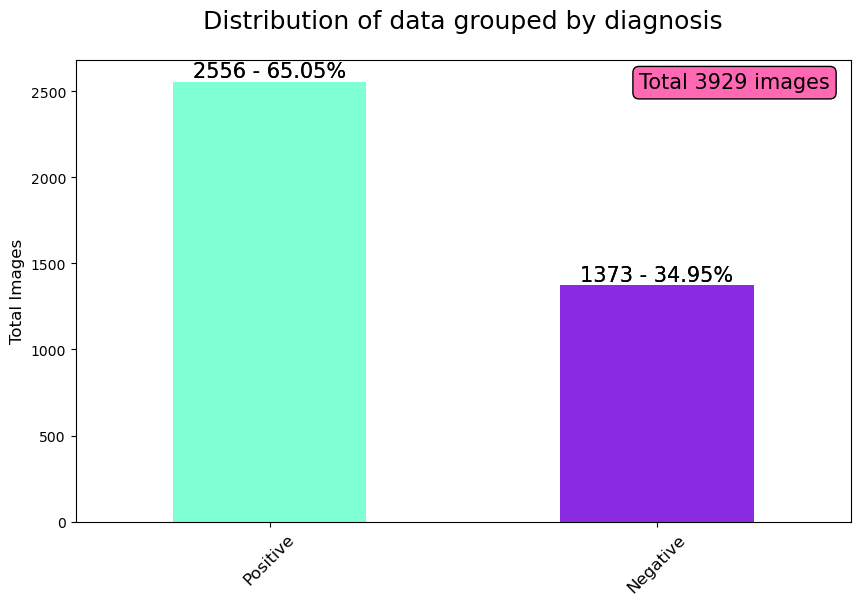

In [11]:
# Plot
ax = brain_df.diagnosis.value_counts().plot(kind='bar',
                                            stacked=True,
                                            figsize=(10, 6),
                                            color=["aquamarine", "blueviolet"])


ax.set_xticklabels(["Positive", "Negative"], rotation=45, fontsize=12);
ax.set_ylabel('Total Images', fontsize = 12)
ax.set_title("Distribution of data grouped by diagnosis",fontsize = 18, y=1.05)

# Annotate
for i, rows in enumerate(brain_df.diagnosis.value_counts().values):
    for p in ax.patches:
        x=p.get_bbox().get_points()[:,0]
        y=p.get_bbox().get_points()[1,1]
        ax.annotate("{} - {:.2f}%".format(int(y), 100.*y/len(brain_df)),
                    xy = (x.mean(), y), color = "black",rotation = 0,
                    ha = "center", verticalalignment = "bottom",
                    fontsize = 15)
    
ax.text(1.2, 2550, "Total {} images".format(len(brain_df)), size = 15, ha="center",
        va = "center", bbox = dict(boxstyle="round",
                                   ec ="black",
                                   fc = "hotpink"))

plt.savefig("Distibution of data grouped by diagnosis.png")
plt.show()


### Distribution of Positive / Negative Diagnosis Between Each Patient

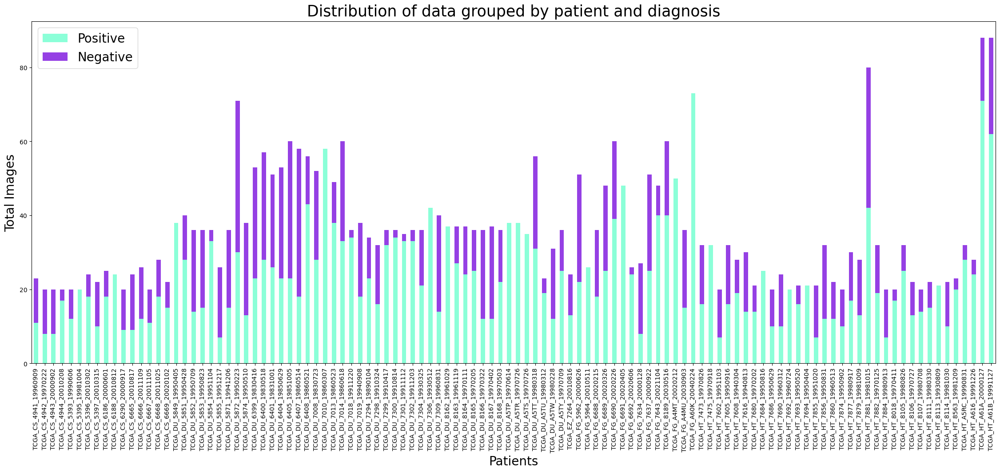

In [12]:
# Data
patients_by_diagnosis = brain_df.groupby(['patient_id', 'diagnosis'])['diagnosis'].size().unstack().fillna(0)
patients_by_diagnosis.columns = ["Positive", "Negative"]

# Plot
ax = patients_by_diagnosis.plot(kind='bar',stacked=True,
                                figsize=(28, 10),
                                color=["aquamarine", "blueviolet"], 
                                alpha=0.9)
ax.legend(fontsize=20);
ax.set_xlabel('Patients',fontsize = 20)
ax.set_ylabel('Total Images', fontsize = 20)
ax.set_title("Distribution of data grouped by patient and diagnosis",fontsize = 25, y=1.005)


plt.savefig("Distribution of data grouped by patient and diagnosis.png")
plt.show()

### Low Grade Glioma Detection on Brain MRI Images with original color and hot colormap

**Why is hot color map will be used in visualization of brain MRI images?**

- Hot color map is a color map from matplotlib library that is commonly used to visualize brain MRI images.The main reason why this colormap is important is that it is able to effectively highlight different tissue types in the brain based on their MRI intensities.The hot color maps low intensity values to dark colors (black) and high intensity values to bright colors (red, yellow, and white). This helps to distinguish different structures in the brain such as grey matter, white matter and cerebrospinal fluid.
- Additionally, Hot colormap is also useful in differentiating between healthy and abnormal tissue, such as tumors. Tumors often have different intensity values compared to the surrounding healthy tissue, and using a colormap like hot can help to highlight these differences and make them more visible. This can be helpful for radiologists and physicians when analyzing the images, and can be useful in determining the diagnosis and treatment of the patient.
- It's important to note that the choice of colormap is not only important for visualizing the data but also for the analysis of the data, for example in brain tumor segmentation tasks, the choice of colormap will be important to define the threshold values for the segmentation algorithm.

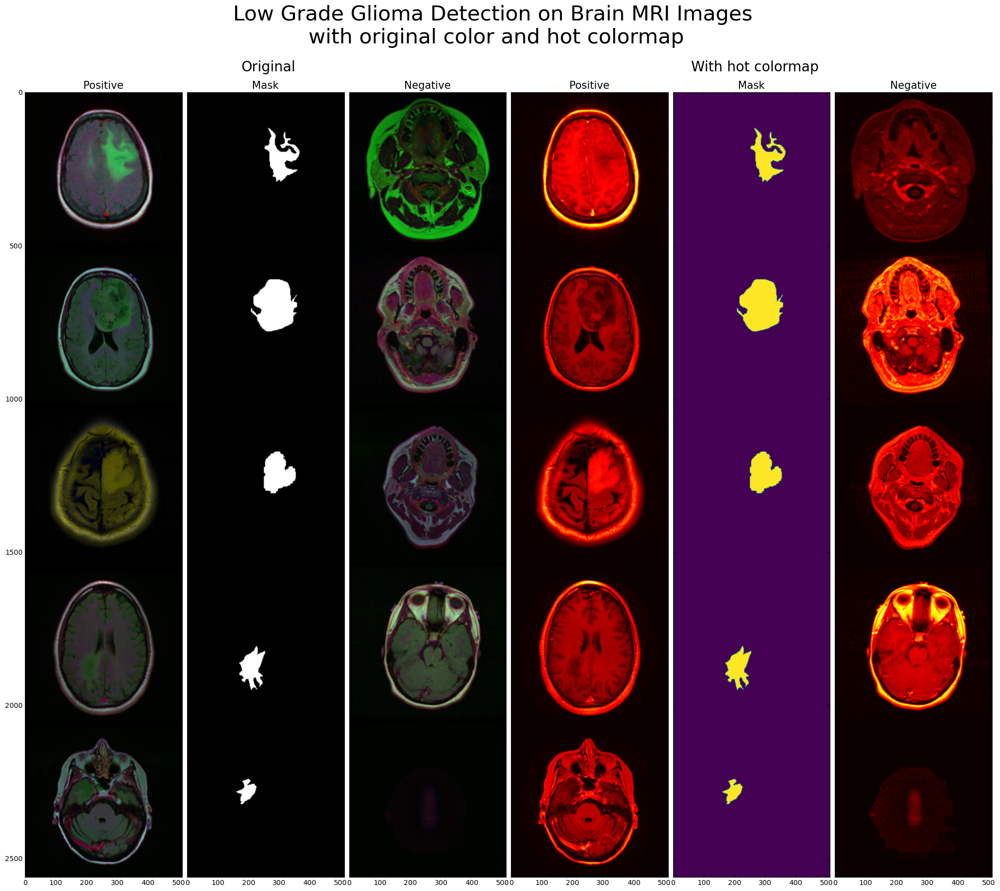

In [13]:
# Data
sample = brain_df[brain_df["diagnosis"] == 1].sample(5)

sample_yes_brain_df = sample.image_path.values
sample_mask_brain_df = sample.mask_path.values
sample_no_brain_df = brain_df[brain_df["diagnosis"] == 0].sample(5).image_path.values

sample_imgs = []
for i, (yes,mask, no) in enumerate(zip(sample_yes_brain_df,sample_mask_brain_df, sample_no_brain_df)):
    yes = cv2.resize(cv2.imread(yes), (IMG_SIZE, IMG_SIZE))
    mask = cv2.resize(cv2.imread(mask), (IMG_SIZE, IMG_SIZE))
    no = cv2.resize(cv2.imread(no), (IMG_SIZE, IMG_SIZE))
    sample_imgs.extend([yes, mask, no])


sample_yes_arr = np.vstack(np.array(sample_imgs[::3]))
sample_mask_arr = np.vstack(np.array(sample_imgs[1::3]))
sample_no_arr = np.vstack(np.array(sample_imgs[2::3]))

# Plot
fig = plt.figure(figsize=(25.,25.))
grid = ImageGrid(fig, 111, # similar to subplot(111)
                 nrows_ncols=(1,6), # creates 2x2 grid of axes
                 # first - fourth column positive
                 # second - fifth column mask
                 # third - sixth column negative
                 axes_pad=0.1, # pad between axes in inch
                )


# Positive - original
grid[0].imshow(sample_yes_arr)
grid[0].set_title("Positive", fontsize = 15)
grid[0].axis("off")

# Positive - original - mask
grid[1].imshow(sample_mask_arr)
grid[1].set_title("Mask", fontsize = 15)
grid[1].axis("off")

# Negative - original
grid[2].imshow(sample_no_arr)
grid[2].set_title("Negative", fontsize = 15)
grid[2].axis("off")

# Positive - hot colormap
grid[3].imshow(sample_yes_arr[:,:,0], cmap="hot")
grid[3].set_title("Positive", fontsize = 15)
grid[3].axis("off")

# Mask - hot colormap
grid[4].imshow(sample_mask_arr[:,:,0])
grid[4].set_title("Mask", fontsize = 15)
grid[4].axis("off")

# Negative - hot colormap
grid[5].imshow(sample_no_arr[:,:,0], cmap="hot")
grid[5].set_title("Negative", fontsize = 15)
grid[5].axis("off")

# Annotations
plt.figtext(0.32,0.83,"Original", va="center", ha="center", size=20)
plt.figtext(0.71,0.83,"With hot colormap", va="center", ha="center", size=20)
plt.suptitle("Low Grade Glioma Detection on Brain MRI Images\n with original color and hot colormap", y=.88, fontsize=30)


# save and show
plt.savefig("Low Grade Glioma Detection on Brain MRI Images\n with original color and hot colormap.png", bbox_inches='tight', pad_inches=0.2, transparent=True)
plt.show()


### Tumor location is show as segmented on one Brain MRI

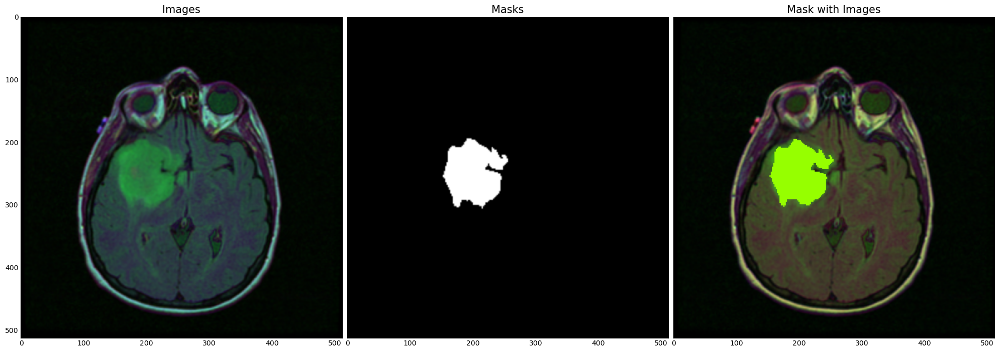

In [14]:
# Data
sample_df = brain_df[brain_df["diagnosis"] == 1].sample(1).values
for i, data in enumerate(sample_df):
    img = cv2.resize(cv2.imread(data[1]), (IMG_SIZE, IMG_SIZE))
    mask = cv2.resize(cv2.imread(data[2]), (IMG_SIZE, IMG_SIZE))
    img_with_mask = cv2.resize(cv2.imread(data[1]), (IMG_SIZE, IMG_SIZE))
    img_with_mask[(mask==255).all(-1)] = [0,255,150]

# Plot
fig = plt.figure(figsize=(25., 25.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(1, 3),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

grid[0].imshow(img)
grid[0].set_title("Images", fontsize=15)
grid[0].axis("off")

grid[1].imshow(mask)
grid[1].set_title("Masks", fontsize=15)
grid[1].axis("off")

grid[2].imshow(cv2.cvtColor(img_with_mask, cv2.COLOR_BGR2RGB))
grid[2].set_title("Mask with Images", fontsize=15)
grid[2].axis("off")

plt.show()

### Tumor location is shown as segmented on multiple Brain MRIs

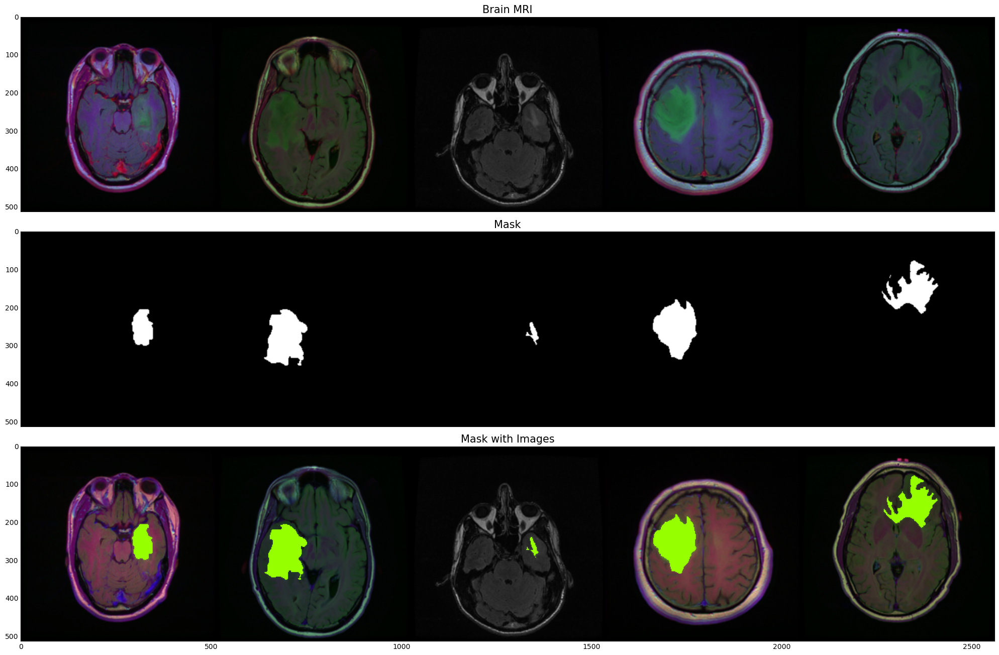

In [15]:
# Data
sample_df = brain_df[brain_df["diagnosis"] == 1].sample(5).values
sample_imgs = []
for i, data in enumerate(sample_df):
    #print(data)
    img = cv2.resize(cv2.imread(data[1]), (IMG_SIZE, IMG_SIZE))
    mask = cv2.resize(cv2.imread(data[2]), (IMG_SIZE, IMG_SIZE))
    img_with_mask = cv2.resize(cv2.imread(data[1]), (IMG_SIZE, IMG_SIZE))
    img_with_mask[(mask==255).all(-1)] = [0,255,150]


    sample_imgs.extend([img, mask, img_with_mask])

sample_imgs_arr = np.hstack(np.array(sample_imgs[::3]))
sample_masks_arr = np.hstack(np.array(sample_imgs[1::3]))
sample_imgs_with_masks_arr = np.hstack(np.array(sample_imgs[2::3]))

# Plot
fig = plt.figure(figsize=(25., 25.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(3, 1),  # creates 2x2 grid of axes
                 axes_pad=0.4,  # pad between axes in inch.
                 )

grid[0].imshow(sample_imgs_arr)
grid[0].set_title("Brain MRI", fontsize=15)
grid[0].axis("off")

grid[1].imshow(sample_masks_arr)
grid[1].set_title("Mask", fontsize=15)
grid[1].axis("off")

grid[2].imshow(cv2.cvtColor(sample_imgs_with_masks_arr, cv2.COLOR_BGR2RGB))
grid[2].set_title("Mask with Images", fontsize=15)
grid[2].axis("off")

plt.show()

## Data Augmentation

In the data augmentation part, the Albumentations library will be used because its wide range of image segmentation techniques that can be applied to medical images.

The library provides specialized augmentations for medical images such as elastic deformation, brightness and contrast changes, and random rotation, scaling, and flipping which are important to simulate the variability that can occur in medical images. This can help to improve the robustness and generalization of the model by providing more diverse training data.

Additionally, Albumentations allows for easy composition of multiple augmentations together to create complex data augmentation pipelines, which can be useful for medical image segmentation tasks where multiple augmentations may be needed to account for variations in images.

Furthermore, it is built on top of numpy and opencv libraries, which allows for fast and efficient processing of images and it's easy to use and well-documented.

In [16]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

In [17]:
device

device(type='cuda', index=0)

**Data Generator**

In [18]:
class BrainMRIDataset(Dataset):
    def __init__(self, df, transforms):
        
        self.df = df
        self.transforms = transforms
        
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, index):
        image = cv2.imread(self.df.iloc[index, 1])
        mask = cv2.imread(self.df.iloc[index, 2], 0)

        augmented = self.transforms(image=image, 
                                    mask=mask)
 
        image = augmented['image']
        mask = augmented['mask']   
        
        return image, mask
    
        # unnormilize mask
        # mask = torch.clamp(mask.float(), min=0, max=1)
        # mask = torch.ceil(mask)

### Transform

In [19]:
PATCH_SIZE = 128

# p: p(float): probability of applying the transform. Default: 0.5

strong_transforms = A.Compose([
    # create a transform for crop the image
    A.RandomResizedCrop(width = PATCH_SIZE, 
                        height = PATCH_SIZE, 
                        p=1.0),
    A.HorizontalFlip(p=0.5), # Flip the input horizontally around the y-axis
    A.VerticalFlip(p=0.5), # Flip the input vertically around the x-axis
    A.RandomRotate90(p=0.5), # Randomly rotate the input by 90 degrees zero or more times.
    A.Transpose(p=0.5), # Transpose the input by swapping rows and columns.
    A.ShiftScaleRotate(shift_limit=0.01, scale_limit=0.04, rotate_limit=0, p=0.25), # # Randomly apply affine transforms: translate, scale and rotate the input.
    
    # Pixels
    A.RandomBrightnessContrast(p=0.5), # Randomly change brightness and contrast of the input image.
    A.RandomGamma(p=0.25),
    A.IAAEmboss(p=0.25),
    A.Blur(p=0.01, blur_limit = 3), # Blur the input image using a random-sized kernel
    
    # Affine
    # ElasticTransform : It is a technique that used a random displacement field to deform the images. This can make the model robust to small variations in the input data.
    # GridDistortion: It is a technique that wraps the image by applying a random grid of points. This can make the model more robust to small variations in the input data.
    # OpticalDistortion: It is a technique that simulates the effects of a camera lens by applying random distortions to the image. This can make the model more robust to small variations in the input data, particularly for image classification tasks.
    A.OneOf([ #Select one of transforms to apply.
        A.ElasticTransform(p=0.5, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03),
        A.GridDistortion(p=0.5),
        A.OpticalDistortion(p=1, distort_limit=2, shift_limit=0.5)], p=0.8),
    
    A.Normalize(p=1.0),
    ToTensor(),
])


transforms = A.Compose([
    A.Resize(width = PATCH_SIZE, height = PATCH_SIZE, p=1.0),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.Transpose(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.01, scale_limit=0.04, rotate_limit=0, p=0.25),
    A.Normalize(p=1.0),
    ToTensor(),
])

#### Example of GridDistortion and Elastic Transform

![Grid distortion and elastic transform applied to a medical image.](https://www.researchgate.net/profile/Alexandr-Kalinin/publication/327742409/figure/fig4/AS:672412618211333@1537327069812/Grid-distortion-and-elastic-transform-applied-to-a-medical-image.jpg)

### Split data on train-val-test

In [20]:
# Split brain_df int train_df and valid_df
train_df, valid_df = train_test_split(brain_df,stratify=brain_df.diagnosis, test_size=0.1)
train_df = train_df.reset_index(drop=True)
valid_df = valid_df.reset_index(drop=True)

# Split train_df into train_df and test_df
train_df, test_df = train_test_split(train_df, stratify=train_df.diagnosis, test_size=0.15)
train_df = train_df.reset_index(drop=True)

print("Train: {} \nValid: {} \nTest: {}".format(train_df.shape,valid_df.shape, test_df.shape))

Train: (3005, 4) 
Valid: (393, 4) 
Test: (531, 4)


### Applying augmentation to each dataframe

In [21]:
# train
train_dataset = BrainMRIDataset(df=train_df, transforms=transforms)
train_dataloader = DataLoader(train_dataset, batch_size=26, num_workers=4, shuffle=True)

# valid
valid_dataset = BrainMRIDataset(df=valid_df, transforms=transforms)
valid_dataloader = DataLoader(valid_dataset, batch_size=26, num_workers=4, shuffle=True)

#test
test_dataset = BrainMRIDataset(df=test_df, transforms=transforms)
test_dataloader = DataLoader(test_dataset, batch_size=26, num_workers=4, shuffle=True)

### Augmentation Result

torch.Size([26, 3, 128, 128]) torch.Size([26, 1, 128, 128])


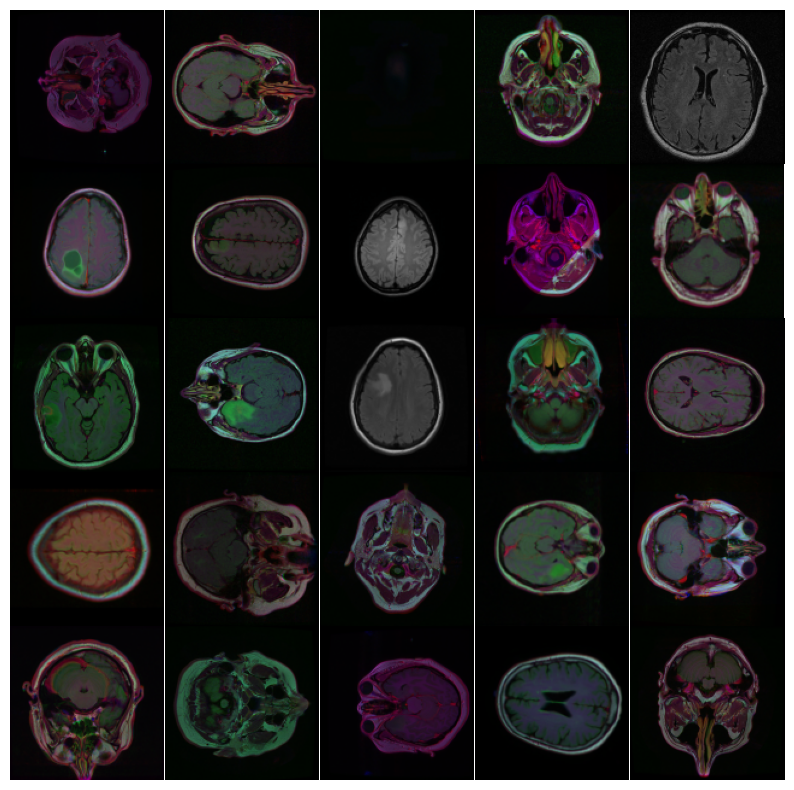

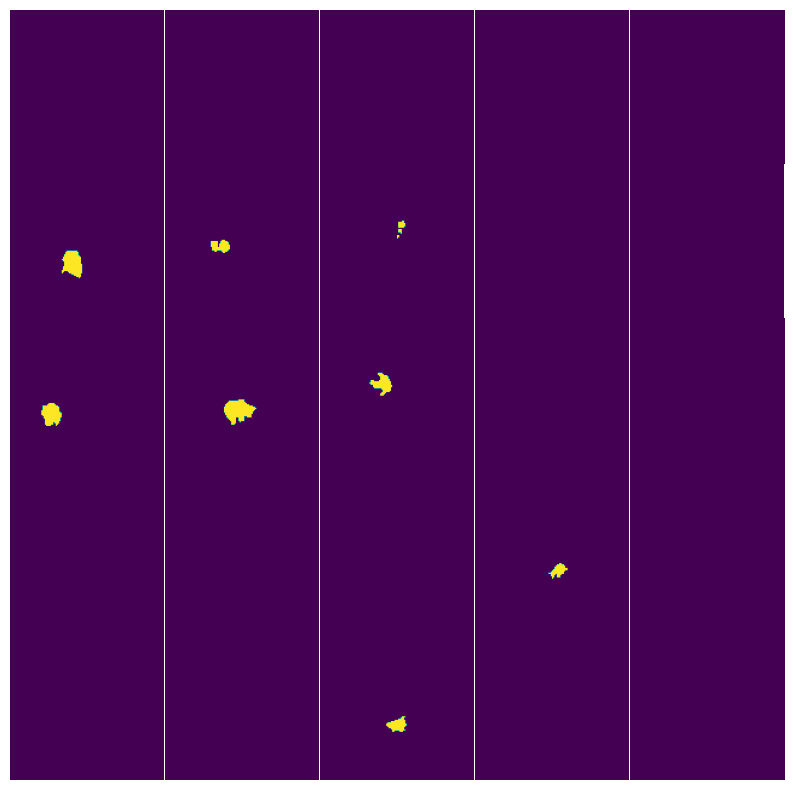

In [22]:
def show_augmentation_images(inputs, nrows=5, ncols=5, image=True, mask=None, mask_color=(1,0,0)):
    
    # create a new figure with specified size
    plt.figure(figsize=(10, 10))
    # adjust the space between subplots
    plt.subplots_adjust(wspace=0., hspace=0.)
    i_ = 0
    
    # if the number of inputs is greater than 25, only show the first 25
    if len(inputs) > 25:
        inputs = inputs[:25]
    
    # iterate throuh the inputs
    for idx in range(len(inputs)):
    
        # normalize the image
        if image is True:
            # take the numpy array of image and transpose the dimensions
            img = inputs[idx].numpy().transpose(1,2,0)
            # specify the mean and std for normalization
            mean = [0.485, 0.456, 0.406]
            std = [0.229, 0.224, 0.225] 
            # normalize the image
            img = (img*std+mean).astype(np.float32)
        else:
            # convert the input to numpy array and select the first channel
            img = inputs[idx].numpy().astype(np.float32)
            img = img[0,:,:]
        
        
        # If mask is given, then change the color of mask to given color
        if mask is not None:
            mask_img = inputs[idx].numpy().astype(np.float32)
            mask_img = (mask_img==255).all(-1).astype(np.float32)
            img[np.where(np.repeat(mask_img[:, :, np.newaxis], 3, axis=2))] = mask_color
            img = cv2.img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = img.astype(np.float32)

        # plot
        plt.subplot(nrows, ncols, i_+1)
        plt.imshow(img); 
        plt.axis('off')
 
        i_ += 1
        
    return plt.show()


# get the images and masks   
images, masks = next(iter(train_dataloader))

# show the images and masks with different colors on mask
print(images.shape, masks.shape)

show_augmentation_images(images)
show_augmentation_images(masks, image=False)

## Modeling

There are a number of neural network models that can be used for segmentation of low-grade glioma, each with their own strengths and weaknesses. Some popular models that have been used for this task include:

1. **U-Net**: U-Net is a specific type of FCN that is designed for biomedical image segmentation. It is composed of an encoder and a decoder, which are trained to learn features from the input image and then use these features to predict a segmentation mask. It has been widely used in brain tumor segmentation task. The encoder is composed of a series of convolutional layers that extract features from the input image, and the decoder is composed of a series of upsampling layers that increase the spatial resolution of the features.
2. **FPN (Feature Pyramid Network)**: It is a type of deep neural network architecture that is designed for object detection and semantic segmentation tasks. FPNs are built on top of a CNN and they are used to extract features at multiple scales.  They work by creating a pyramid of feature maps, where each level of the pyramid corresponds to a different scale.
3. **ResUNet**: ResNet is a type of CNN that uses residual connections between layers to allow the network to learn deeper and more complex representations of the input data. U-Net, is a type of CNN that is designed for biomedical image segmentation. It is composed of an encoder and a decoder, which are trained to learn features from the input image and then use these features to predict a segmentation mask. ResUNet combines the encoder-decoder architecture of U-Net with the residual connections of ResNet, this allows the network to learn more robust features from the input images and improve the performance of the segmentation task.

**There are several reasons  why I would use PyTorch instead of Keras, TensorFlow on this project:**
- PyTorch has a more intuitive and flexible API, which makes it easier to work with for complex tasks such as segmentation. This allows for more experimentation and iteration in the development process.
- PyTorch has built-in support for dynamic computational graphs, which can be useful for tasks such as segmentation where the model needs to adapt to different input shapes and sizes.
- Pytorch allows for easy debugging, since the forward pass is defined by a single function, and the backward pass is defined by the autograd system.


### Vanilla U-Net Architecture

The U-Net architecture is composed of an encoder network and a decoder network, which are connected by a set of "skip connections."
The encoder network is made up of a series of convolutional and max pooling layers that progressively reduce the spatial resolution of the input image while increasing the number of feature maps. This allows the network to extract increasingly complex and abstract features from the image.

The decoder network is made up of a series of upsampling layers and convolutional layers that restore the spatial resolution of the feature maps while decreasing the number of feature maps. The output of the decoder network is a segmentation mask that corresponds to the input image.

The "skip connections" concatenate feature maps from corresponding layers in the encoder and decoder networks, allowing the network to make use of both high- and low-level information from the input image.

The diagram of U-Net architecture would typically show the input image at the top, and the output segmentation mask at the bottom. The encoder network would be shown on the left side of the diagram, with the layers arranged vertically and labeled with the number of feature maps and the size of the kernel for the convolutional layers. The decoder network would be shown on the right side of the diagram, with the layers arranged vertically and labeled with the number of feature maps and the size of the kernel for the convolutional layers. The "skip connections" would be shown as arrows connecting corresponding layers in the encoder and decoder networks.

![U-Net Architecture](https://github.com/edaaydinea/Low-Grade-Glioma-Segmentation/blob/main/Pictures/u-net-architecture.png?raw=true)

In [23]:
# This function creates a double convolutional layer block for the U-Net architecture
def double_conv(in_channels, out_channels):
    return nn.Sequential(
        # First convolutional layer with input channels and output channels, kernel size of 3x3 and padding of 1
        nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
        # ReLU activation function applied to the output of the first convolutional layer in place
        nn.ReLU(inplace=True),
        # Second convolutional layer with output channels, kernel size of 3x3 and padding of 1
        nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
        # ReLU activation function applied to the output of the second convolutional layer in place
        nn.ReLU(inplace=True))


In this study, U-Net-35 was used, consisting of 15 convolutional, 14 rectified linear units (ReLU), three max-pooling, and three upsampling layers.

In [24]:
class UNet(nn.Module):

    def __init__(self, n_classes):
        super().__init__()

        # Initialize a UNet model with number of classes

        # Defining double convolutional layers for the encoder part of the UNet
        self.conv_down1 = double_conv(3, 64)
        self.conv_down2 = double_conv(64, 128)
        self.conv_down3 = double_conv(128, 256)
        self.conv_down4 = double_conv(256, 512)

        # Defining maxpool layer
        self.maxpool = nn.MaxPool2d(2)

        # Defining upsampling layer
        self.upsample = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)

        # Defining double convolutional layers for the decoder part of the UNet
        self.conv_up3 = double_conv(256 + 512, 256)
        self.conv_up2 = double_conv(128 + 256, 128)
        self.conv_up1 = double_conv(128 + 64, 64)

        # Defining the last convolutional layer for the output
        self.last_conv = nn.Conv2d(64, n_classes, kernel_size=1)


    def forward(self, x):

        # ENCODER PART
        # Pass the input image through the first double convolutional layer
        conv1 = self.conv_down1(x)
        # Pass the output of the first double convolutional layer through the maxpool layer
        x = self.maxpool(conv1)

        # Pass the output of the maxpool layer through the second double convolutional layer
        conv2 = self.conv_down2(x)
        # Pass the output of the second double convolutional layer through the maxpool layer
        x = self.maxpool(conv2)

        # Pass the output of the maxpool layer through the third double convolutional layer
        conv3 = self.conv_down3(x)
        # Pass the output of the third double convolutional layer through the maxpool layer
        x = self.maxpool(conv3)

        # Pass the output of the maxpool layer through the fourth double convolutional layer
        x = self.conv_down4(x)
        # Pass the output of the fourth double convolutional layer through the upsampling layer
        x = self.upsample(x)

        # Concatenate the output of the upsampling layer with the output of the third double convolutional layer
        x = torch.cat([x, conv3], dim=1)

        # DECODER PART
        # Pass the concatenated output through the third double convolutional layer in the decoder
        x = self.conv_up3(x)
        # Pass the output of the third double convolutional layer in the decoder through the upsampling layer
        x = self.upsample(x)

        # Concatenate the output of the upsampling layer with the output of the second double convolutional layer
        x = torch.cat([x, conv2], dim=1)

        # Pass the concatenated output through the second double convolutional layer in the decoder
        x = self.conv_up2(x)
        # Pass the output of the second double convolutional layer in the decoder through the upsampling layer
        x = self.upsample(x)

        # Concatenate the output of the upsampling layer with the output of the first double convolutional layer
        x = torch.cat([x, conv1], dim=1)

        # Apply the last up-convolutional layer to the concatenated output and upsampled output from the previous step
        x = self.conv_up1(x)

        # Apply the final 1x1 convolutional layer to reduce the number of channels to the desired number of classes
        out = self.last_conv(x)

        # Apply the sigmoid activation function to the output to obtain the probability map for each class
        out = torch.sigmoid(out)

        # Return the final output of the network.
        return out

In [25]:
# Initialize the U-Net architecture with 1 output class and move the model to the selected device.
unet = UNet(n_classes=1).to(device)
# Pass a random tensor of shape (1,3,256,256) as an input to the U-Net model, this tensor is also moved to the selected device
output = unet(torch.randn(1,3,256,256).to(device))

#Print the shape of the output of the U-Net model, it should be (1,1,256,256)
print("",output.shape)

 torch.Size([1, 1, 256, 256])


### Feature Pyramid Network (FPN) Architecture

FPN, or Feature Pyramid Network, is a type of neural network architecture for object detection in computer vision. It is built on top of a backbone CNN, such as ResNet or ResNeXt, and consists of several layers:

- The bottom-up pathway, which starts with the output feature maps of the last convolutional layer of the backbone CNN. These feature maps are then passed through a series of convolutional layers, known as the "lateral layers," that reduce the spatial resolution but increase the number of feature maps.

- The top-down pathway, which starts with the output of the lateral layers and uses a series of transposed convolutional layers, known as the "upsampling layers," to increase the spatial resolution of the feature maps.

- The final layers of the FPN combine the feature maps from the bottom-up pathway and the top-down pathway to form the final feature pyramid.

- Finally, The final feature pyramid is then passed to a head layers for classification and bounding box regression task.

The FPN architecture aims to combine the advantages of both high-level semantic information and low-level spatial information to improve object detection performance.



**FPN**

![](https://github.com/edaaydinea/Low-Grade-Glioma-Segmentation/blob/main/Pictures/feature_pyramid_network.png?raw=true)

**FPN Detail Explanation**

![](https://github.com/edaaydinea/Low-Grade-Glioma-Segmentation/blob/main/Pictures/feature_pyramid_network2.png?raw=true)

**UNeT + FPN**

![](https://github.com/edaaydinea/Low-Grade-Glioma-Segmentation/blob/main/Pictures/feature_pyramid_network3.png?raw=true)

The purpose of the `ConvReluUpSample` class is to define a block of layers for a neural network, which includes a 2D convolutional layer, a group normalization layer and a ReLU activation layer. It also includes an upsampling operation, which is a method to increase the resolution of an image. The class is a PyTorch `nn.Module`, which allows it to take advantage of the pre-built functionality and structure provided by PyTorch's neural network module.

In the constructor, it takes in 3 parameters: `in_channels`, `out_channels`, `upsample`, where *in_channels* is the number of input channels for the convolutional layer, - *out_channels* is the number of output channels, and the *upsample* flag is used to indicate whether to perform upsampling operation on the output. It also creates an instance of `nn. Upsample`, which is a PyTorch built-in module for upsampling, with a scale factor of 2, mode "bilinear" and align_corners set to True. Then it create a sequential module that contains the convolutional layer, the group normalization layer and the ReLU activation layer.

The `forward` method of the class takes an input tensor "x", applies the convolutional block operations on it, and then checks the upsample flag, if it is set to True, it performs the upsampling operation on the output, otherwise it returns the output of the block. The class is typically used as a building block for a neural network that performs image segmentation, which is the task of classifying every pixel in an image.

In [26]:
class ConvReluUpSample(nn.Module):
    def __init__(self, in_channels, out_channels, upsample=False) :
        super().__init__()
        self.upsample = upsample
        self.make_upsample = nn.Upsample(scale_factor=2, mode="bilinear",align_corners=True)
        # Create a 2D convolutional layer with the specified number of input and output channels, kernel size of 3x3, stride of 1, and padding of 1. 
        self.block = nn.Sequential(
            nn.Conv2d(in_channels=in_channels, 
                      out_channels=out_channels, 
                      kernel_size= (3,3),
                      stride = 1,
                      padding = 1,
                      bias = False),
            # Apply group normalization to the output of the convolutional layer
            nn.GroupNorm(num_groups = 32, 
                         num_channels = out_channels),
            # Apply ReLU activation function to the output of the group normalization
            nn.ReLU(inplace = True)
        )
    # Defines the forward method of the class, which takes an input tensor "x", and performs the convolutional block operations on it
    def forward(self, x):
        x = self.block(x)
        if self.upsample:
            # Apply the upsampling operation to the output of the convolutional block.
            x = self.make_upsample(x)
        return x

The purpose of the `SegmentationBlock` class is to define a block of layers for a segmentation neural network. The class is a PyTorch `nn.Module`, which allows it to take advantage of the pre-built functionality and structure provided by PyTorch's neural network module. The block is composed of one or more instances of the `ConvReluUpSample` class, where the block performs a convolution operation followed by ReLU activation and upsampling on the input. The number of up-sampling operations to be performed in the block is specified by the `n_upsamples` parameter. This class is used as a building block for a neural network that performs image segmentation, which is the task of classifying every pixel in an image.

In [27]:
class SegmentationBlock(nn.Module):
    def __init__(self, in_channels, out_channels, n_upsamples=0):
        super().__init__()
        # This block is used to perform the convolution operation followed by ReLU activation and upsampling.
        blocks = [ConvReluUpSample(in_channels=in_channels,
                                   out_channels=out_channels,
                                   upsample=bool(n_upsamples))]
        if n_upsamples > 1:
            for _ in range(1, n_upsamples):
                #  This allows for multiple up-sampling operations to be performed in the block.
                blocks.append(ConvReluUpSample(in_channels=in_channels,
                                   out_channels=out_channels,
                                   upsample=True))
        
        self.block = nn.Sequential(*blocks)
    
    # Apply the input through the sequential block of convolutional layers, and return the output of the block.
    def forward(self,x):
        return self.block(x)

This code part is an implementation of the Feature Pyramid Network(FPN) architecture using PyTorch library. The FPN model is a deep neural network architecture that is commonly used for object detection and segmentation.
 
 The architecture of the FPN network is divided into several parts:
 
 - **Bottom-up layers**: Five convolutional layers `self.conv_bottomup1`, `self.conv_bottomup2`, `self.conv_bottomup3`, `self.conv_bottomup4`, `self.conv_bottomup5`, each followed by a max pooling layer, are used to create a pyramid of feature maps with decreasing spatial resolutions, starting from the input image. These layers are responsible for creating a coarse-to-fine representation of the input image.
- **Top-down layer**: A single convolutional layer `self.topdown`, is used to upsample the highest-resolution feature map from the bottom-up layers and combine it with the lower-resolution feature maps from the lateral layers to refine the feature maps and generate more detailed predictions.
- **Smooth layers**:  Three convolutional layers, `self.smooth1`, `self.smooth2`, `self.smooth3`, are used to smooth the feature maps from the top-down layer. 
- **Lateral layers**: Three convolutional layers, `self.lateral1`, `self.lateral2`, `self.lateral3`, are used to project the feature maps from the bottom-up layers to the same resolution as the feature maps from the top-down layer so they can be combined.
- **Segmentation block layers**: A list of SegmentationBlock layers, `self.seg_blocks`, are used to generate segmentation maps by applying upsampling and convolutional layers.
- **Last layer**: A single convolutional layer, `self.last_conv`, is used to generate final predictions by converting the feature maps from the segmentation block into a single output map.

The `forward()` method of the FPN class is where the forward pass of the network is implemented. It takes an input image and applies the bottom-up layers to create a pyramid of feature maps with decreasing spatial resolutions. The top-down layer is then applied to the highest-resolution feature map, and the feature maps from the bottom-up layers are combined with the feature maps from the top-down layer using the lateral layers. The smooth layers are then applied to further refine the feature maps, and the segmentation block layers are applied to generate the final segmentation maps. The last layer is used to generate final predictions by converting the feature maps from the segmentation block into a single output map.
  

In [28]:
class FPN(nn.Module):
    
    def __init__(self, n_classes=1,
                 pyramid_channels = 256,
                 segmentation_channels = 256):
        super().__init__()
        
        # Bottom-up layers
        self.conv_bottomup1 = double_conv(3, 64)
        self.conv_bottomup2 = double_conv(64, 128)
        self.conv_bottomup3 = double_conv(128, 256)
        self.conv_bottomup4 = double_conv(256, 512)
        self.conv_bottomup5 = double_conv(512, 1024)
        self.maxpool = nn.MaxPool2d(2)
        
        # Top-down layer
        self.topdown = nn.Conv2d(1024, 256, kernel_size=1,
                                  stride=1, padding=0)
        
        # Smooth layers
        self.smooth1 = nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1)
        self.smooth2 = nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1)
        self.smooth3 = nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1)
        
        # Lateral layers
        self.lateral1 = nn.Conv2d(512, 256, kernel_size=1, stride=1, padding=0)
        self.lateral2 = nn.Conv2d(256, 256, kernel_size=1, stride=1, padding=0)
        self.lateral3 = nn.Conv2d(128, 256, kernel_size=1, stride=1, padding=0)
        
        # Segmentation block layers
        self.seg_blocks = nn.ModuleList([
            SegmentationBlock(in_channels=pyramid_channels,
                              out_channels=segmentation_channels,
                              n_upsamples=n_upsamples) for n_upsamples in [0, 1, 2, 3]])
        
        # Last layer
        self.last_conv = nn.Conv2d(256, n_classes, kernel_size=1, stride=1, padding=0)
    
    
    def upsample_add(self, x, y):
        _,_,H,W = y.size()
        upsample = nn.Upsample(size=(H,W),
                               mode="bilinear",
                               align_corners=True)
        return upsample(x) + y
    

    def upsample(self, x, h, w):
        sample = nn.Upsample(size=(h,w),
                             mode="bilinear",
                             align_corners=True)
        return sample(x)
    
    
    def forward(self, x):
            
            # Bottom-up
            c1 = self.maxpool(self.conv_bottomup1(x))
            c2 = self.maxpool(self.conv_bottomup2(c1))
            c3 = self.maxpool(self.conv_bottomup3(c2))
            c4 = self.maxpool(self.conv_bottomup4(c3))
            c5 = self.maxpool(self.conv_bottomup5(c4)) 
            
            # Top-down
            p5 = self.topdown(c5) 
            p4 = self.upsample_add(p5, self.lateral1(c4)) 
            p3 = self.upsample_add(p4, self.lateral2(c3))
            p2 = self.upsample_add(p3, self.lateral3(c2)) 
            
            # Smooth
            p4 = self.smooth1(p4)
            p3 = self.smooth2(p3)
            p2 = self.smooth3(p2)
            
            # Segmentation
            _, _, h, w = p2.size()
            feature_pyramid = [seg_block(p) for seg_block, p in zip(self.seg_blocks, [p2, p3, p4, p5])]
            
            out = self.upsample(self.last_conv(sum(feature_pyramid)), 4 * h, 4 * w)
            
            out = torch.sigmoid(out)
            return out
        

In [29]:
# Initialize the FPN architecture model
fpn = FPN().to(device)

# Pass a random tensor of shape (1,3,256,256) as an input to the FPN model, this tensor is also moved to the selected device
output = fpn(torch.randn(1,3,256,256).to(device))

# Print the shape of the output of the FPN model, it should be (1,1,256,256)
print(output.shape)

torch.Size([1, 1, 256, 256])


### UNet with ResNeXt50 Backbone Architecture

UNet is a popular image segmentation architecture that is composed of an encoder and a decoder. The encoder is typically a pre-trained deep convolutional neural network (CNN) such as ResNeXt50, that is used to extract features from the input image. The decoder then takes these features and uses them to generate a segmentation mask.

A UNet with ResNeXt50 backbone is an implementation of the UNet architecture, where the encoder part of the network is a ResNeXt50 model. ResNeXt50 is a deep CNN architecture that was introduced in 2016 and has been shown to achieve state-of-the-art performance on various computer vision tasks, such as object detection and image classification. By using a pre-trained ResNeXt50 model as the encoder, the UNet model is able to leverage the rich feature representations learned by the ResNeXt50 model, which allows it to better segment objects in the input image.

In [30]:
# Combines a 2D convolutional layer and a ReLU activation function.
class ConvolutionalReLU(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, padding):
        super().__init__()
        
        self.convolutional_relu_layer = nn.Sequential(
            nn.Conv2d(in_channels=in_channels,
                      out_channels=out_channels,
                      kernel_size=kernel_size,
                      padding=padding),
            # inplace = True argument is used to modify the input tensor in place rather than creating a new one, which can save memory.
            nn.ReLU(inplace=True)
        )
    
    def forward(self,x):
        x = self.convolutional_relu_layer(x)
        return x

In [31]:
# Extracts features from input images and ultimately produces images with higher resolutions
class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        
        # This layer creates half as many output channels as input channels.
        self.conv1 = ConvolutionalReLU(in_channels, in_channels // 4, 1, 0)
        # This layer increases the resolution of the input images by 2x.
        self.deconv = nn.ConvTranspose2d(in_channels // 4, in_channels // 4, kernel_size=4,
                                         stride = 2, padding = 1, output_padding=0)
        self.conv2 = ConvolutionalReLU(in_channels // 4, out_channels, 1, 0)
    
    def forward(self, x):
        x = self.conv1(x)
        x = self.deconv(x)
        x = self.conv2(x)
        
        return x

The purpose of next code to create a custom PyTorch module called UNetWithResNeXt50, which is an implementation of a U-Net architecture that uses a pre-trained ResNeXt-50 model as its encoder. The U-Net architecture is commonly used in image segmentation tasks. 

The module first loads a pre-trained ResNeXt50 model using the PyTorch `models.resnext50_32x4d(pretrained=True)` function and assigns it to the `self.pretrained_model` variable. Then it creates a list of the layers of the pre-trained model called `self.base_layers`. The module also creates an array called `filters` which contains the number of filters for the encoder and decoder layers.

The module then defines five `nn.Sequential` modules `self.encoder0`, `self.encoder1`, `self.encoder2`, `self.encoder3` and `self.encoder4` which are responsible for the down-sampling part of the U-Net. Each encoder consists of a number of layers from the pre-trained model, as defined by the `self.base_layers` list.

The module also defines four DecoderBlock modules `self.decoder4`, `self.decoder3`, `self.decoder2`, `self.decoder1` which are responsible for the up-sampling part of the U-Net. Each decoder takes in two arguments, the number of input and output filters.

Finally, the module defines two more layers `self.last_conv0` and `self.last_conv1` which are final classifier, `self.last_conv0` is a ConvolutionalReLU layer and `self.last_conv1` is a 2D convolutional layer which takes in 128 channel input and output n_classes channel.



In [32]:
class UNetWithResNeXt50(nn.Module):
    def __init__(self, n_classes):
        super().__init__()
        
        self.pretrained_model = models.resnext50_32x4d(pretrained=True)
        self.base_layers = list(self.pretrained_model.children())
        filters = [4*64, 4*128, 4*256, 4*512]
        
        # Down - sampling
        self.encoder0 = nn.Sequential(*self.base_layers[:3])
        self.encoder1 = nn.Sequential(*self.base_layers[4])
        self.encoder2 = nn.Sequential(*self.base_layers[5])
        self.encoder3 = nn.Sequential(*self.base_layers[6])
        self.encoder4 = nn.Sequential(*self.base_layers[7])
        
        # Up - sampling
        self.decoder4 = DecoderBlock(filters[3], filters[2])
        self.decoder3 = DecoderBlock(filters[2], filters[1])
        self.decoder2 = DecoderBlock(filters[1], filters[0])
        self.decoder1 = DecoderBlock(filters[0], filters[0]) 
        
        # Final Classifier
        self.last_conv0 = ConvolutionalReLU(256, 128, 3, 1)
        self.last_conv1 = nn.Conv2d(128, n_classes, kernel_size=3, padding=1)
        
    
    def forward(self, x):
        # Down - sampling
        # Reducing its spatial dimensions and increasing the number of feature maps.
        x = self.encoder0(x)
        e1 = self.encoder1(x)
        e2 = self.encoder2(e1)
        e3 = self.encoder3(e2)
        e4 = self.encoder4(e3)

        # Up sampling + skip connections
        # Performs up-sampling on the feature maps and combines them with the feature maps from corresponding encoder layer through skip connections
        d4 = self.decoder4(e4) + e3
        d3 = self.decoder3(d4) + e2
        d2 = self.decoder2(d3) + e1
        d1 = self.decoder1(d2)

        # final classifier
        out = self.last_conv0(d1)
        out = self.last_conv1(out)
        out = torch.sigmoid(out)
        
        return out

In [33]:
# Initialize the Unet with ResNeXt-50 Backbone model
unet_rx50 = UNetWithResNeXt50(n_classes=1).to(device)

# Pass a random tensor of shape (1,3,256,256) as an input to the UNet with ResNeXt-50 model, this tensor is also moved to the selected device
output = unet_rx50(torch.randn(1,3,256,256).to(device))

# Print the shape of the output of the UNet with ResNeXt-50 model, it should be (1,1,256,256)
print(output.shape)

Downloading: "https://download.pytorch.org/models/resnext50_32x4d-7cdf4587.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-7cdf4587.pth



torch.Size([1, 1, 256, 256])


### Segmentation Quality Metric

Segmentation quality metric is a measure of how well a segmentation model is able to identify and classify different regions in an image. There are several metrics commonly used to evaluate the quality of image segmentation models, including:

1. **Intersection over Union(IoU)**: This metric compares the overlap between the predicted segmentation and the ground truth segmentation. It is commonly used in object detection and semantic segmentation tasks. 
2. **Dice coefficient**: This metric measures the similarity between the predicted segmentation and the ground truth segmentation. It ranges from 0 (no overlap) to 1 (perfect overlap).

$$ \text{Dice coefficient} = \frac{2 \times \text{Intersection of predicted and target}}{\text{Predicted pixels} + \text{Target pixels}} $$

3. **Precision and Recall**: Precision is the ratio of true positive pixels to the total number of predicted positive pixels, and recall is the ratio of true positive pixels to the total number of ground truth positive pixels.
4. **F1-Score**: It is the harmonic mean of precision and recall.

In [34]:
def dice_coef_metric(pred, target):
    
    # Calculation of intersection between pred and target
    intersection = 2.0 * (target * pred).sum()
    # Calculation of union between pred and target
    union = target.sum() + pred.sum()
    # Checks if both pred and target are empty, if so it returns 1.0
    if target.sum() == 0 and pred.sum() == 0:
        return 1.0
    
    # Returns the dice coefficient metric by dividing the intersection by the union.
    return intersection / union 

# Metric check
dice_coef_metric(np.array([0., 0.9]),
                 np.array([0., 1]))

0.9473684210526316

### Segmentation Loss

Segmentation loss is a measure of how well the output of a segmentation model matches the ground truth. Commonly used loss functions for segmentation include cross-entropy and Dice loss.

In [35]:
def dice_coef_loss(inputs, target):
    smooth = 1.0
    intersection = 2.0 * ((target * inputs).sum()) + smooth
    union = target.sum() + inputs.sum() + smooth
    
    return 1 - (intersection / union)

This function calculates the dice coefficient loss between the input and target tensors. The dice coefficient is a similarity metric that measures the overlap between the input and target tensors. The `smooth` variable is added to prevent division by zero errors. The intersection variable is the sum of all the element-wise products of the input and target tensors, multiplied by 2. The union variable is the sum of all elements in the target and input tensors. The final return value is 1 subtracted from the intersection divided by union.

In [36]:
def bce_dice_loss(inputs, target):
    dice_score = dice_coef_loss(inputs, target)
    bce_score = nn.BCELoss()
    bce_loss = bce_score(inputs, target)
    
    return bce_loss + dice_score

# loss check
bce_dice_loss(torch.tensor([0.7, 1., 1.]), 
              torch.tensor([1.,1.,1.]))


tensor(0.1637)

This function calculates the combined BCE and Dice loss. It first calculates the dice loss by calling the `dice_coef_loss`function and passing in the input and target tensors. The it creates an instance of the BCE loss function from PyTorch's nn module. 

The BCE (binary cross-entropy) loss function from PyTorch's nn module is used to calculate the binary cross-entropy loss between the input and target tensors. The loss is calculated as: **$$-\left(target * log(input) + (1 - target) * log(1 - input)\right)$$** where target is the true binary label and input is the predicted probability of the positive class. It is commonly used for binary classification problems, where the goal is to predict the probability of an input being in a certain class.

Finally it calculates the BCE loss by passing the input and target tensors to the `bce_score` function. The combined loss is the sum of the `dice_score` and `bce_loss` values.

### Train Models

In [37]:
def train_model(model_name, model, train_loader, valid_loader, train_loss, optimizer, learning_rate_scheduler, num_epochs):
    
    # Print the model name at the start of the training
    print("-------------------------- {} -------------------------- ".format(model_name))
    
    # Initialize empty lists for storing the loss history, train IoU history, and validation IoU history
    loss_history = []
    train_history = []
    valid_history = []
    
    # Iterates over the number of specified epochs
    for epoch in range(num_epochs):
        
        # Sets the model to train mode
        model.train()
        
        # Initialize empty lists for storing the per-batch loss and train IoU
        losses = []
        # intersection over Union metric for a segmentation model during training.
        train_iou = [] 
        
        
        """
        If a learning rate scheduler is provided, defines warmup factor and number of warmup iterations and creates a scheduler using the warmup_lr_scheduler function.
        
        """
        if learning_rate_scheduler:
            """
            Warmup_factor is a hyperparameter used in training deep learning models, specifically in the context  of optimizer scheduling. 
            It is used to gradually increase the learning rate during the initial stages of training, in order to avoid the optimizer grom getting stuck in poor local minima. 
            The idea behind this is to start with a low learning rate, and then gradually increase it over time, so that the optimizer can adapt to the changing loss landscape. 
            This can help in achieving faster convergence and better performance. Warmup factor is typically used along with other learning rate scheduling techniques such as Cosine Annealing.
            """
            warmup_factor = 0.01 
            
            """
            Warmup_iters is a hyperparameter used in deep learning models, particularly in the context of optimization techniques such as stochastic gradient descent (SGD). 
            It refers to the number of iterations during the training process where the learning rate is gradually increased from a small value to its final value.
            The purpose of this is to prevent the model from being updated too quickly at the beginning of training, which can lead to poor performance or instability. 
            The technique is know as "learning rate warmup".
            """
            warmup_iters = min(100, len(train_loader)-1)
            
            """
            In deep learning, a learning rate scheduler is a technique used to adjust the learning rate of a model during training. 
            The learning rate is the step size at which the optimizer makes updates to the model parameters. 
            A high learning rate can cause the optimizer to overshoot the optimal solution and a low learning rate can cause the optimizer to converge too slowly. 
            """
            learning_rate_scheduler = warmup_lr_scheduler(optimizer, warmup_iters, warmup_factor)
        

        # Iterates over the train loader for each batch
        for i_step, (data, target) in enumerate(train_loader):
            
            # Move the data and target to the specified device (usually GPU)
            data = data.to(device)
            target = target.to(device)
            
            # Pass the data through the model get outputs
            outputs = model(data)
            
            # Compute the IoU on the output and target 
            out_cut = np.copy(outputs.data.cpu().numpy())
            out_cut[np.nonzero(out_cut < 0.5)] = 0.0
            out_cut[np.nonzero(out_cut >= 0.5)] = 1.0
            train_dice = dice_coef_metric(out_cut, target.data.cpu().numpy())
            
            # Compute the loss on the output and target
            loss = train_loss(outputs, target)
            
            # Append the loss and IoU to their respective lists
            losses.append(loss.item())
            train_iou.append(train_dice)

            # Perform backpropagation and optimization step
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # If a learning rate scheduler is provided, step the scheduler
            if learning_rate_scheduler:
                learning_rate_scheduler.step()


        # Computes the mean IoU on the validation set
        valid_mean_iou = compute_iou(model, valid_loader)
        
        # Appends the mean loss, mean train IoU, and mean validation IoU to their respective history lists
        loss_history.append(np.array(losses).mean())
        train_history.append(np.array(train_iou).mean())
        valid_history.append(valid_mean_iou)
        
        
        # Prints the mean loss, mean train IoU, and mean validation IoU for the current epoch
        print("Epoch [%d]" % (epoch))
        print("Mean loss on train:", np.array(losses).mean(), 
              "\nMean DICE on train:", np.array(train_iou).mean(), 
              "\nMean DICE on validation:", valid_mean_iou)
    
    # Returns the loss history, train IoU history, and validation IoU history at the end of the training.
    return loss_history, train_history, valid_history
              

In [38]:
def warmup_lr_scheduler(optimizer, warmup_iters, warmup_factor):
    # Take the current iteration number as input.
    # The inner function is used to define the learning rate schedule during the warmup phase.
    def f(x):
        # If the current iteration number is greater than or equal to the number of warmup iterations, the function returns a learning rate of 1. This means that the learning rate will remain constant after the warmup phase. 
        if x >= warmup_iters:
            return 1
        # Otherwise, the function calculates the learning rate as a linear interpolation between the warmup factor and 1. 
        # alpha is the ratio of the current iteration to the number of warmup iterations.
        # This means that the learning rate will increase linearly from the warmup factor to 1 during the warmup phase.
        alpha = float(x) / warmup_iters
        return warmup_factor * (1 - alpha) + alpha
    # This scheduler can be used to adjust the learning rate during training based on the current iteration number.
    return torch.optim.lr_scheduler.LambdaLR(optimizer,f)

In [39]:
def compute_iou(model, loader, threshold = 0.3):
    """
    This function is used to compute the Intersection over Union(IoU) score for a segmentation model.
    """
    # This variable will be used to track the total IoU score across all data samples in the loader.
    valid_loss = 0
    
    # Create a context manager using torch.no_grad() to temporarily set all the requires_grad flag to false.
    with torch.no_grad():
        
        # Iterate over the data and target pairs in the loader.
        # Each iteration processes on batch of data.
        for i_step, (data, target) in enumerate(loader):
            
            # move the data to device
            data = data.to(device)
            # move the target to device
            target = target.to(device)

            # Perform a forward pass on the model and stores the output in the "outputs" variable.
            outputs = model(data)

            # Create a copy of the output and store it to the out_cut variable.
            out_cut = np.copy(outputs.data.cpu().numpy())
            # Set all values in out_cut less than the threshold to 0.
            out_cut[np.nonzero(out_cut < threshold)] = 0.0
            # Set all values in out_cut greater than or equal to the threshold to 1.
            out_cut[np.nonzero(out_cut >= threshold)] = 1.0
            
            # Compute the IoU for this data sample using the dice_coef_metric function, and adds it to the valid_loss variable
            pic_loss = dice_coef_metric(out_cut, target.data.cpu().numpy())
            valid_loss += pic_loss
            
    # Return the average IoU score across all data samples in the loader by dividing valid_loss by the total number of steps.
    return valid_loss / i_step

In [40]:
unet_optimizer = torch.optim.Adamax(params=unet.parameters(),lr=1e-3)
fpn_optimizer = torch.optim.Adamax(params=fpn.parameters(), lr=1e-3)
unet_rx50_optimizer = torch.optim.Adam(params=unet_rx50.parameters(), lr=5e-4)

In [41]:
num_epochs = 10 

# Train U-Net
unet_loss_history, unet_train_history, unet_valid_history = train_model(model_name="Vanilla U-Net",
                                                                        model= unet,
                                                                        train_loader=train_dataloader,
                                                                        valid_loader=valid_dataloader,
                                                                        train_loss=bce_dice_loss, 
                                                                        optimizer=unet_optimizer, 
                                                                        learning_rate_scheduler=False, 
                                                                        num_epochs=20)


-------------------------- Vanilla U-Net -------------------------- 
Epoch [0]
Mean loss on train: 0.7905341381656712 
Mean DICE on train: 0.27650101608749894 
Mean DICE on validation: 0.5204537153277412
Epoch [1]
Mean loss on train: 0.5328849374220289 
Mean DICE on train: 0.5384251552301991 
Mean DICE on validation: 0.6308243044437717
Epoch [2]
Mean loss on train: 0.47355023591682827 
Mean DICE on train: 0.5885041451274652 
Mean DICE on validation: 0.6778478093775466
Epoch [3]
Mean loss on train: 0.41893581365203036 
Mean DICE on train: 0.6332829340042153 
Mean DICE on validation: 0.7057184040493243
Epoch [4]
Mean loss on train: 0.4071739549780714 
Mean DICE on train: 0.6441038052903124 
Mean DICE on validation: 0.7682467842370316
Epoch [5]
Mean loss on train: 0.36933520282136983 
Mean DICE on train: 0.6782115429098179 
Mean DICE on validation: 0.7937082628553996
Epoch [6]
Mean loss on train: 0.36219712423867195 
Mean DICE on train: 0.6835309000128674 
Mean DICE on validation: 0.72326

In [43]:
num_epochs = 10 

# Train Feature Pyramid Network (FPN)
fpn_loss_history, fpn_train_history, fpn_valid_history = train_model(model_name="FPN",
                                                                     model=fpn,
                                                                     train_loader=train_dataloader,
                                                                     valid_loader=valid_dataloader,
                                                                     train_loss=bce_dice_loss,
                                                                     optimizer=fpn_optimizer,
                                                                     learning_rate_scheduler=False,
                                                                     num_epochs=20)


-------------------------- FPN -------------------------- 
Epoch [0]
Mean loss on train: 0.9099177312234352 
Mean DICE on train: 0.13584638285242473 
Mean DICE on validation: 0.46336082853101995
Epoch [1]
Mean loss on train: 0.6448056957331197 
Mean DICE on train: 0.44402702727514015 
Mean DICE on validation: 0.6155644169666726
Epoch [2]
Mean loss on train: 0.5200574405748268 
Mean DICE on train: 0.5515338329074644 
Mean DICE on validation: 0.6474962061633186
Epoch [3]
Mean loss on train: 0.475251836894915 
Mean DICE on train: 0.5850917542050551 
Mean DICE on validation: 0.6982802843139085
Epoch [4]
Mean loss on train: 0.45272030899750776 
Mean DICE on train: 0.6035300477104457 
Mean DICE on validation: 0.6764203355992605
Epoch [5]
Mean loss on train: 0.44259314547325 
Mean DICE on train: 0.6113220121587184 
Mean DICE on validation: 0.7191413275676062
Epoch [6]
Mean loss on train: 0.41968203862679415 
Mean DICE on train: 0.6325841345780591 
Mean DICE on validation: 0.7292105392792441
E

In [44]:
num_epochs = 10 

# Train UNet with ResNeXt-50 Backbone
unet_rx50_loss_history, unet_rx50_train_history, unet_rx50_valid_history = train_model(model_name="UNet with ResNeXt-50 Backbone",
                                                                                       model=unet_rx50,
                                                                                       train_loader=train_dataloader,
                                                                                       valid_loader=valid_dataloader,
                                                                                       train_loss=bce_dice_loss,
                                                                                       optimizer=unet_rx50_optimizer,
                                                                                       learning_rate_scheduler=False,
                                                                                       num_epochs=num_epochs)

-------------------------- UNet with ResNeXt-50 Backbone -------------------------- 
Epoch [0]
Mean loss on train: 0.7000317606946518 
Mean DICE on train: 0.41762512497544924 
Mean DICE on validation: 0.7797898476430601
Epoch [1]
Mean loss on train: 0.27304142739238413 
Mean DICE on train: 0.7657136683937776 
Mean DICE on validation: 0.822309024964441
Epoch [2]
Mean loss on train: 0.23289263890735035 
Mean DICE on train: 0.8000685174223728 
Mean DICE on validation: 0.8565271071244283
Epoch [3]
Mean loss on train: 0.22132127160399123 
Mean DICE on train: 0.8096891266932719 
Mean DICE on validation: 0.8752883061959538
Epoch [4]
Mean loss on train: 0.21435651716230245 
Mean DICE on train: 0.8137911149771221 
Mean DICE on validation: 0.8725784792379446
Epoch [5]
Mean loss on train: 0.17281220166076874 
Mean DICE on train: 0.8498846568231518 
Mean DICE on validation: 0.9331018394383418
Epoch [6]
Mean loss on train: 0.1955457586024342 
Mean DICE on train: 0.8284603803496222 
Mean DICE on val

## Evaluation


### Plotting Graphs

In [49]:
def plot_model_history(model_name,train_history, valid_history, num_epochs):
    
    x = np.arange(num_epochs)

    fig = plt.figure(figsize=(10, 6))
    plt.plot(x, valid_history, label='train dice', lw=3, c="aquamarine")
    plt.plot(x, train_history, label='validation dice', lw=3, c="blueviolet")

    plt.title("{}".format(model_name), fontsize=15)
    plt.legend(fontsize=12)
    plt.xlabel("Epoch", fontsize=15)
    plt.ylabel("DICE", fontsize=15)

    fn = str(int(time.time())) + ".png"
    plt.savefig(fn, bbox_inches='tight', pad_inches=0.2)
    plt.show()


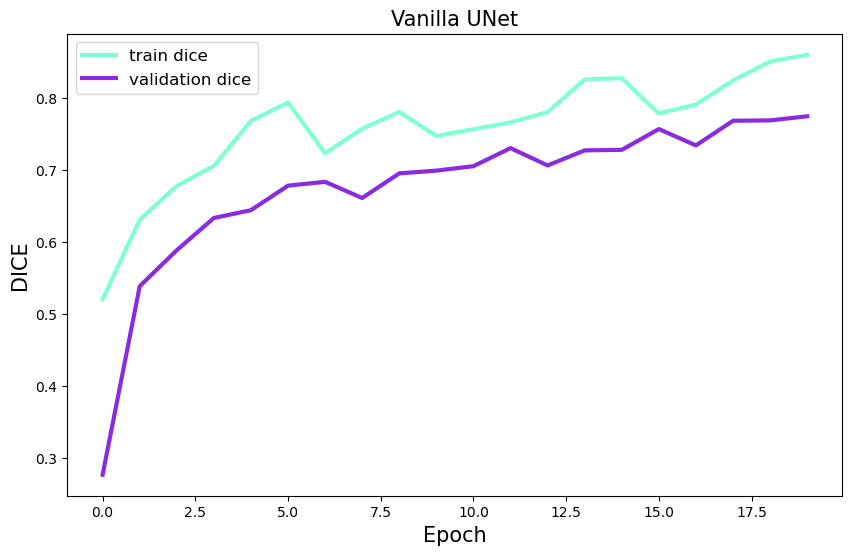

In [51]:
plot_model_history("Vanilla UNet", unet_train_history, unet_valid_history, 20)

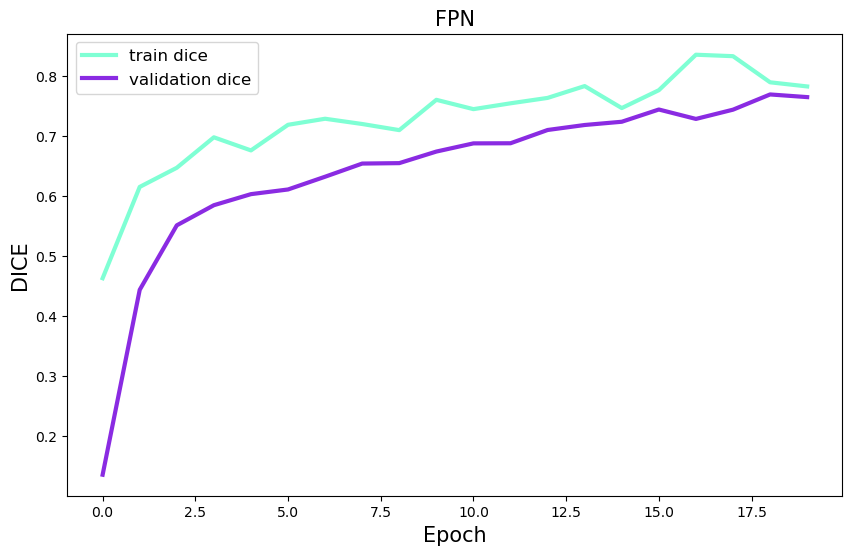

In [52]:
plot_model_history("FPN", fpn_train_history, fpn_valid_history, 20)

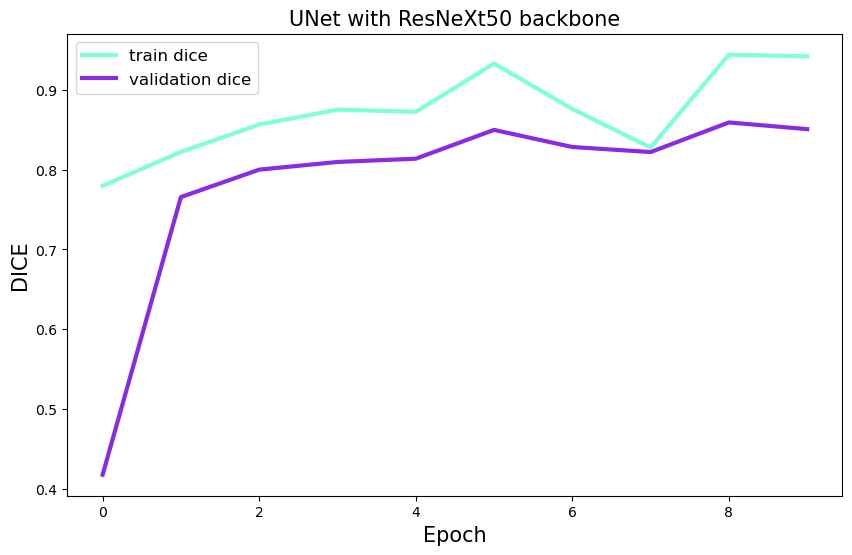

In [53]:
plot_model_history("UNet with ResNeXt50 backbone", unet_rx50_train_history, unet_rx50_valid_history, num_epochs)

### Test Prediction

In [54]:
test_iou = compute_iou(unet, test_dataloader)
print(f"""Vanilla UNet\nMean IoU of the test images - {np.around(test_iou, 2)*100}%""")

Vanilla UNet
Mean IoU of the test images - 83.0%


In [55]:
test_iou = compute_iou(fpn, test_dataloader)
print(f"""FPN\nMean IoU of the test images - {np.around(test_iou, 2)*100}%""")


FPN
Mean IoU of the test images - 78.0%


In [56]:
test_iou = compute_iou(unet_rx50, test_dataloader)
print(f"""UNet with ResNeXt50 backbone\nMean IoU of the test images - {np.around(test_iou, 2)*100}%""")

UNet with ResNeXt50 backbone
Mean IoU of the test images - 89.0%


### Random Test Sample

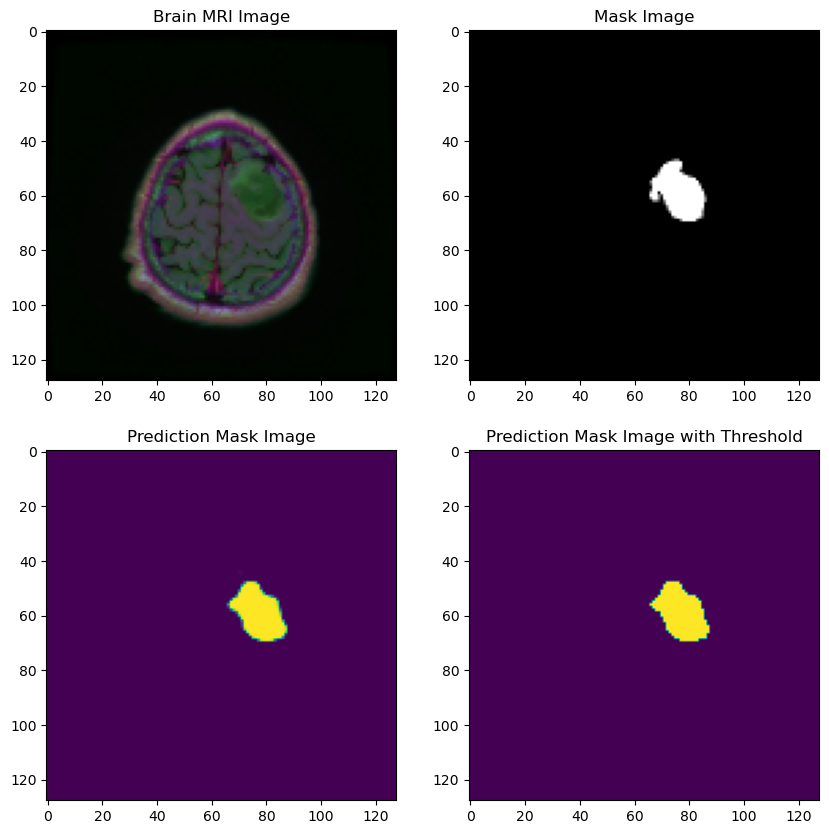

In [57]:
########### BRAIN MRI IMAGE ###########

# select one random sample from test dataframe where diagnosis is 1
test_sample = test_df[test_df["diagnosis"] == 1].sample(1).values[0] 

# reads the image from the path in the first column of the test sample variable and resize it to 128x128
brain_mri_image = cv2.resize(cv2.imread(test_sample[1]), (128, 128))

########### MASK IMAGE ###########

# reads the image from the path in the second column of the test sample variable and resize it to 128x12
mask_image = cv2.resize(cv2.imread(test_sample[2]), (128, 128))

########### PREDICTION MASK IMAGE ###########

# convert the brain_mri_image variable to float32 tensor, normalize it by dividind it by 255
# add an extra dimension to it with unsqueeze method
# permute the dimensions with permute method to be read to be fed to the model.
prediction = torch.tensor(brain_mri_image.astype(np.float32) / 255.).unsqueeze(0).permute(0,3,1,2)

# perform the forward pass of the prediction tensor through the unet_rx50 model
prediction = unet_rx50(prediction.to(device))

# convert the prediction tensor from the model output back to a numpy array
# remove the extra dimensions added before
prediction = prediction.detach().cpu().numpy()[0,0,:,:]

########### PREDICTION MASK IMAGE WITH THRESHOLD ###########

# create a copy of the prediction array
prediction_threshold = np.copy(prediction)

# replace all values below 0.3 with 0
prediction_threshold[np.nonzero(prediction_threshold < 0.3)] = 0.0

# replace all values above or equal to 0.3 with 255
prediction_threshold[np.nonzero(prediction_threshold >= 0.3)] = 255.#1.0
prediction_threshold = prediction_threshold.astype("uint8")

# PLOT
fig, ax = plt.subplots(nrows=2,  ncols=2, figsize=(10, 10))

ax[0, 0].imshow(brain_mri_image)
ax[0, 0].set_title("Brain MRI Image")

ax[0, 1].imshow(mask_image)
ax[0, 1].set_title("Mask Image")

ax[1, 0].imshow(prediction)
ax[1, 0].set_title("Prediction Mask Image")

ax[1, 1].imshow(prediction_threshold)
ax[1, 1].set_title("Prediction Mask Image with Threshold")

plt.show()


In [58]:
test_samples = test_df[test_df["diagnosis"] == 1].sample(105).values


def batch_preds_overlap(model, samples):
    """
    Computes prediction on the dataset
    
    Returns: list with images overlapping with predictions
    
    """
    
    # initialize an empty list which will be used to store the images with overlapped predictions and ground truth
    prediction_overlap = []

    for test_sample in samples:

        ########### SAMPLE ###########
        
        # resize the image to (128,128)
        image = cv2.resize(cv2.imread(test_sample[1]),(128, 128))
        # normalize the image by dividing it by 255
        image =  image / 255.

        
        
        ########### GROUND TRUTH ###########
        
        # convert the ground truth a binary image by thresholding it at 127 and converting t to an 8-bit unsigned integer (uint8)
        ground_truth = cv2.resize(cv2.imread(test_sample[2], 0), (128, 128)).astype("uint8")

        
        
        ########### PREDICTION ###########
        
        # pass the image through the model and gets the prediction
        prediction = torch.tensor(image).unsqueeze(0).permute(0,3,1,2)
        prediction = model(prediction.to(device).float())
        prediction = prediction.detach().cpu().numpy()[0,0,:,:]

        # thresholds the prediction at 0.3, 
        # setting all values below 0.3 to 0 and all values greater than or equal to 0.3 to 255
        prediction[np.nonzero(prediction < 0.3)] = 0.0
        prediction[np.nonzero(prediction >= 0.3)] = 255.#1.0
        
        # convert the thresholded prediction to an 8-bit unsigned integer (uint8)
        prediction = prediction.astype("uint8")

        
        
        ########### OVERLAP ###########
        original_img = cv2.resize(cv2.imread(test_sample[1]),(128, 128))

        _, thresh_gt = cv2.threshold(ground_truth, 127, 255, 0)
        _, thresh_p = cv2.threshold(prediction, 127, 255, 0)
        
        # find countours of the ground truth and prediction binary images using OpenCV's findContours() functions
        contours_gt, _ = cv2.findContours(thresh_gt, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        contours_p, _ = cv2.findContours(thresh_p, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

        # draw the contours of the ground truth and prediction on the original image using OpenCV's drawContours() function 
        overlap_img = cv2.drawContours(original_img, contours_gt, 0, (0, 255, 0), 1)
        overlap_img = cv2.drawContours(overlap_img, contours_p, 0, (255,36,0), 1)#255,0,0
        
        # append the resulting image with the overlapped contours to the prediction_overlap list
        prediction_overlap.append(overlap_img)

    return prediction_overlap
    


In [59]:
prediction_overlap_unet = batch_preds_overlap(unet, test_samples)

In [60]:
prediction_overlap_fpn = batch_preds_overlap(fpn, test_samples)

In [61]:
prediction_overlap_unet_rx50 = batch_preds_overlap(unet_rx50, test_samples)

In [62]:
# DATA

# unet plates
pred_overlap_5x1_unet = []
pred_overlap_5x3_unet = []

# fpn plates
pred_overlap_5x1_fpn = []
pred_overlap_5x3_fpn = []

# rx plates
pred_overlap_5x1_unet_rx50 = []
pred_overlap_5x3_unet_rx50 = []


"""
For each iteration, it takes a slice of 5 consecutive elements from each of these lists and
concatenates them horizontally using the numpy function np.hstack().

The first argument is the start value of the range.
The second argument is the end value of the range.
The third argument is the step size.
"""
for i in range(5, 105+5, 5):
    pred_overlap_5x1_unet.append(np.hstack(np.array(prediction_overlap_unet[i-5:i])))
    pred_overlap_5x1_fpn.append(np.hstack(np.array(prediction_overlap_fpn[i-5:i])))
    pred_overlap_5x1_unet_rx50.append(np.hstack(np.array(prediction_overlap_unet_rx50[i-5:i])))
    
"""
For each iteration,  it takes a slice of 3 consecutive elements from each of these lists and 
concatenates them vertically using the numpy function np.vstack().
"""
for i in range(3, 21+3, 3):
    pred_overlap_5x3_unet.append(np.vstack(pred_overlap_5x1_unet[i-3:i]))
    pred_overlap_5x3_fpn.append(np.vstack(pred_overlap_5x1_fpn[i-3:i]))
    pred_overlap_5x3_unet_rx50.append(np.vstack(pred_overlap_5x1_unet_rx50[i-3:i]))

In [63]:
# PLOT

def plot_plate_overlap(batch_preds, title, num):
    plt.figure(figsize=(15, 15))
    plt.imshow(batch_preds)
    plt.axis("off")

    plt.figtext(0.76,0.75,"Green - Ground Truth", va="center", ha="center", size=20,color="lime");
    plt.figtext(0.26,0.75,"Red - Prediction", va="center", ha="center", size=20, color="#ff0d00");
    plt.suptitle(title, y=.80, fontsize=20, weight="bold", color="#00FFDE");

    fn = "_".join((title+str(num)).lower().split()) + ".png"
    plt.savefig(fn, bbox_inches='tight', pad_inches=0.2, transparent=False, facecolor='black')
    plt.close()



In [64]:
title1 = "Predictions of Vanilla UNet"

for num, batch in enumerate(pred_overlap_5x3_unet):
    plot_plate_overlap(batch,title1, num)

In [67]:
title2 = "Predictions of FPN"

for num, batch in enumerate(pred_overlap_5x3_fpn):
    plot_plate_overlap(batch,title2, num)

In [65]:
title3 = "Predictions of UNet with ResNeXt50 backbone"

for num, batch in enumerate(pred_overlap_5x3_unet_rx50):
    plot_plate_overlap(batch,title3, num)

### Gifs

In [76]:
from PIL import Image

def make_gif(title):
    
    # join the lowercase version of the title and seperated by a space.
    base_name = "_".join(title.lower().split())

    base_len = len(base_name) 
    end_len = len(".png")
    
    
    fp_in = f"{base_name}*.png"
    fp_out = f"{base_name}.gif"
    
    # Use the glob library to search for all the png files that match the file pattern in "fp_in"
    # Sort the files by their index number, which is extracted from the file name by slicing the string and converting it to integer
    img, *imgs = [Image.open(f) 
                  for f in sorted(glob.glob(fp_in), key=lambda x : int(x[base_len:-end_len]))]
    
    # uses the Image module of the PIL library to open the first image and rest of the images
    img.save(fp=fp_out, format='GIF', append_images=imgs,
             save_all=True, duration=1000, loop=0)
    
    return fp_out


In [77]:
fn1 = make_gif(title1)


In [78]:
fn2 = make_gif(title2)

In [79]:
fn3 = make_gif(title3)

### Display gifs

In [86]:
import IPython.display as display

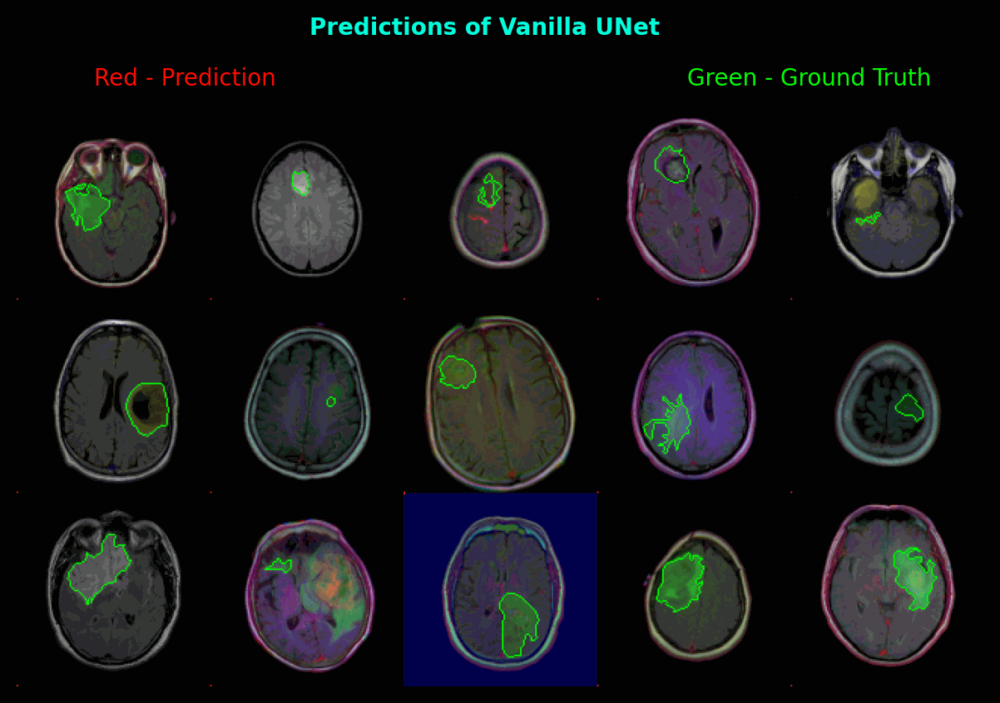

In [89]:
with open(fn1,'rb') as f:
    display.display(display.Image(data=f.read(), format='png'))

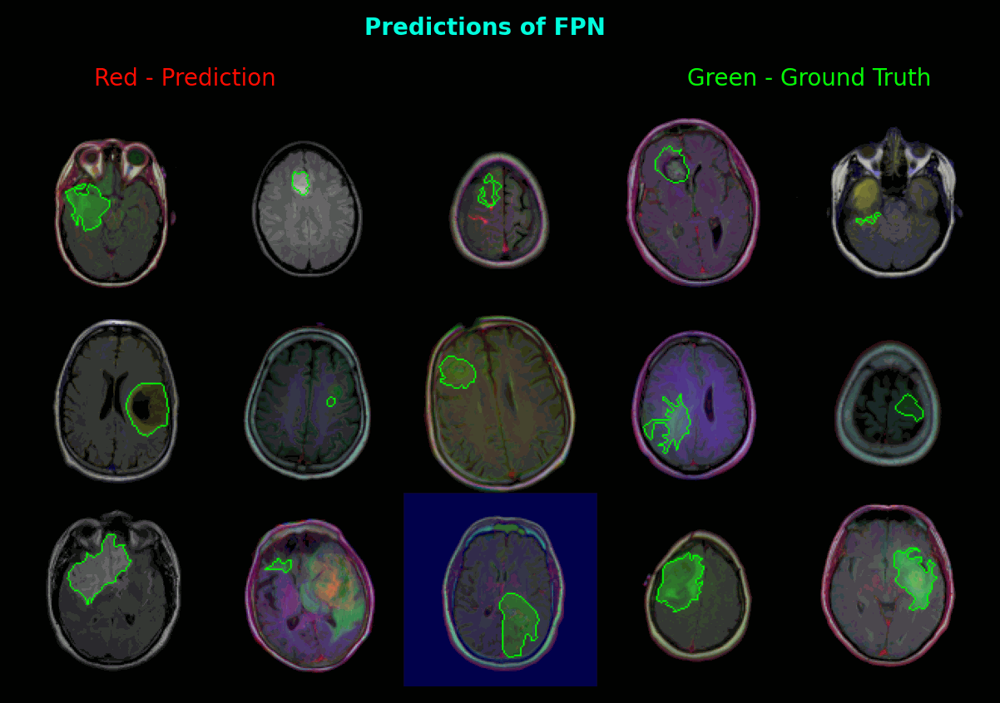

In [83]:
with open(fn2,'rb') as f:
    display.display(display.Image(data=f.read(), format='png'))

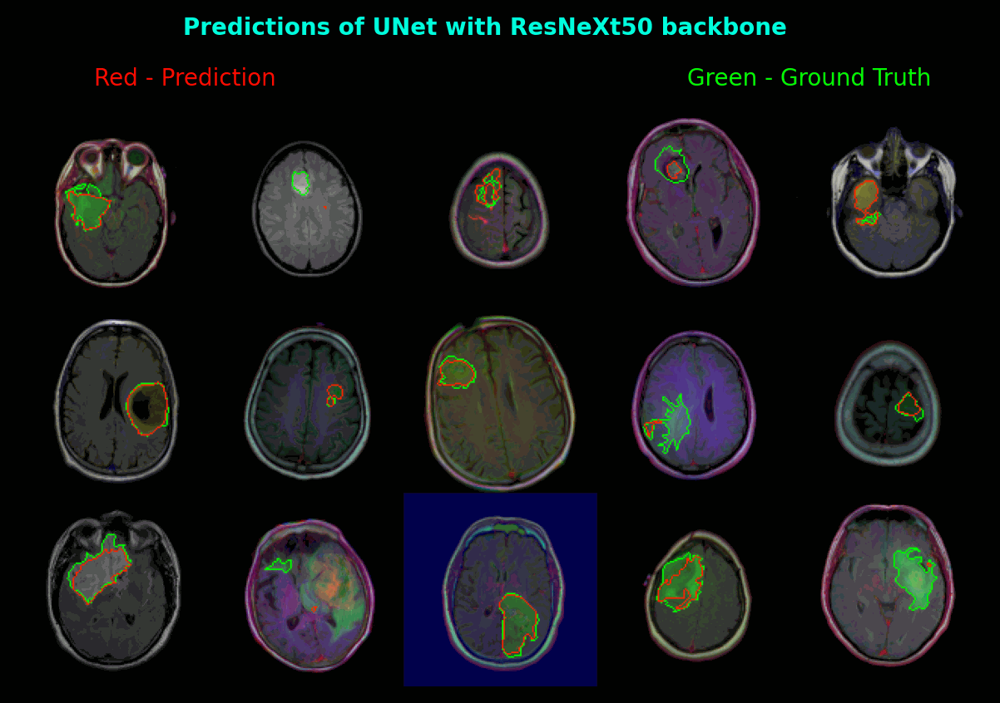

In [82]:
with open(fn3,'rb') as f:
    display.display(display.Image(data=f.read(), format='png'))